# Allocation of Demand based on Disaggregation and Re-aggregation of Data

This notebook is used to disaggregate demand from the FERC-714 dataset, based on the population from census data, then re-aggregating it to different various geometries like REEDs balancing areas, county-level, or at the state level.

## Datasets and inputs used

1. FERC-714 form: Energy sales timeseries data for every planning area

2. 2010 US Census data: Census tract geometries, and tract-level population and characteristics

3. ReEDs balancing geometries: ReEDs geometries containing county level data

4. US Planning Areas: Contains 97 planning area geometries

## Core functions

1. Function to find intersection of the large and small geometries

2. Function to normalize and redistribute from area to another attribute e.g. population

3. Map functions:

4. Timeseries functions: Functions for allocation

## Disposable parts of analysis

1. Cells doing auxiliary analysis like multiple-counted areas, visualizations for state, county and census tracts 

## Intermediate and Final Datasets

Intermediate datasets are required to limit the number of time-consuming calculations. Primarily, the overlay calculation takes excessive time.

### Intermediate Datasets

Area mapping of planning area with census tracts.

### Final Datasets

ReEDs aggregated demand timeseries data

## Workflow

1. There are generally two geometries: one containing primary smaller non-intersecting geometries like tracts, and the other with larger intersecting geometries

### Disaggregation of data

1. 

### Reaggregation of data

1. 


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
import pathlib
import time
import requests
import json
import datetime
import pickle

import pandas as pd
import numpy as np
import scipy.stats

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import colors
from matplotlib.legend import Legend
import matplotlib.patches as mpatches
import seaborn as sns

import pyproj
from geopandas import gpd
from shapely.geometry import Point
import geopandas
import fiona
from geopandas import GeoDataFrame
import addfips

import pudl
from pudl.analysis.demand_mapping import (create_intersection_matrix,
                                          create_stacked_intersection_df,
                                          extract_multiple_tracts_demand_ratios,
                                          extract_time_series_demand_multiple_tracts,
                                          matrix_linear_scaling)

from tqdm import tqdm
tqdm.pandas()

/home/yashkumar/anaconda3/envs/pudl-dev/lib/python3.8/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [3]:
sns.set()
%matplotlib inline
mpl.rcParams['figure.figsize'] = (10,4)
mpl.rcParams['figure.dpi'] = 150
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

In [4]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.StreamHandler(stream=sys.stdout)
log_format = '%(asctime)s [%(levelname)8s] %(name)s:%(lineno)s %(message)s'
formatter = logging.Formatter(log_format)
handler.setFormatter(formatter)
logger.handlers = [handler]

In [5]:
pudl_settings = pudl.workspace.setup.get_defaults()
pudl_settings
API_KEY_EIA = "d2b250683a925a1bddcd63c5d12698c0"
# API_KEY_EIA = os.environ["API_KEY_EIA"]

# Obtain non-PUDL data
Some of the data we're using for this analysis has not yet been fully integrated into PUDL, so we are managing it ad-hoc in a directory at `pudl_settings["data_dir"]/local`

## FERC Form 714
* Download the raw file if we don't have it already.
* Run the draft Extract and Transform steps on it.
* Merge the respondent ID and Planning Area Hourly Demand dataframes.

In [6]:
%%time
def download_zip_url(url, save_path, chunk_size=128):
    r = requests.get(url, stream=True)
    with save_path.open(mode='wb') as fd:
        for chunk in r.iter_content(chunk_size=chunk_size):
            fd.write(chunk)

local_data = pathlib.Path(pudl_settings["data_dir"]) / "local"

ferc714_url = "https://www.ferc.gov/docs-filing/forms/form-714/data/form714-database.zip"
ferc714_dir = local_data / "ferc714"
ferc714_dir.mkdir(parents=True, exist_ok=True)

ferc714_save_path = ferc714_dir / "ferc714.zip"
if ferc714_save_path.exists():
    logger.info("Already have FERC 714 data, not downloading.")
else:
    logger.info("Downloading fresh FERC 714 data.")
    download_zip_url(ferc714_url, ferc714_save_path)

raw_ferc714_dfs = pudl.extract.ferc714.extract(pudl_settings=pudl_settings)
tfr_ferc714_dfs = pudl.transform.ferc714.transform(raw_ferc714_dfs)
pa_demand_ferc714_df = pd.merge(
    tfr_ferc714_dfs["demand_hourly_pa_ferc714"],
    tfr_ferc714_dfs["respondent_id_ferc714"]
)

2020-05-28 21:07:39,446 [    INFO] root:15 Already have FERC 714 data, not downloading.
2020-05-28 21:07:39,447 [    INFO] pudl.extract.ferc714:75 Reading respondent_id_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,451 [    INFO] pudl.extract.ferc714:75 Reading id_certification_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,468 [    INFO] pudl.extract.ferc714:75 Reading gen_plants_ba_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,598 [    INFO] pudl.extract.ferc714:75 Reading demand_monthly_ba_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,622 [    INFO] pudl.extract.ferc714:75 Reading net_energy_load_ba_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,648 [    INFO] pudl.extract.ferc714:75 Reading adjacency_ba_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,720 [    INFO] pudl.extract.ferc714:75 Reading interchange_ba_ferc714 from CSV into pandas DataFrame.
2020-05-28 21:07:39,735 [    INFO] pudl.extract.ferc7

## US Census Tract Geometries and Population
* This US census tract data comes from: http://www2.census.gov/geo/tiger/TIGER2010DP1/Profile-County_Tract.zip

In [7]:
# %%time
# esri_dir = local_data / "esri"
# esri_dir.mkdir(parents=True, exist_ok=True)
# esri_tract_path = esri_dir / "USA_Census_Tract_Boundaries/v10/tracts.gdb"
# census_tract_gdf = (
#     gpd.read_file(esri_tract_path, driver='FileGDB', layer='tracts')
#     # THIS CREATES INVALID FIPS CODES: LEADING ZEROS ARE REQUIRED.
#     .assign(STATE_FIPS=lambda x: pd.to_numeric(x.STATE_FIPS))
#     # Remove all islands and non-mainland states and territories
#     .query("STATE_FIPS<=56 & STATE_FIPS not in (2, 15, 44)")
#     # Project to US Albers conic equal-area projection
#     .to_crs("ESRI:102003")
# )
# census_tract_gdf.sample(5)

# Please don't store FIPS codes as integers
* The FIPS codes are strings because of the leading zeroes
* Turning them into integers, but still calling them FIPS codes will result in bugs later when someone expects them to be normal FIPS codes.
* If you need to use them in a numeric context, you can cast them to `int` just in the context of the comparison

In [8]:
%%time
uscb_census2010_url = "http://www2.census.gov/geo/tiger/TIGER2010DP1/Profile-County_Tract.zip"
uscb_census2010_dir = local_data / "uscb" / "census2010"
uscb_census2010_dir.mkdir(parents=True, exist_ok=True)

uscb_census2010_zipfile = uscb_census2010_dir / "census2010.zip"
uscb_census2010_gdb_dir = uscb_census2010_dir / "census2010.gdb"

if not uscb_census2010_gdb_dir.is_dir():
    logger.info("No Census GeoDB found. Downloading from US Census Bureau.")
    # Download to appropriate location
    download_zip_url(uscb_census2010_url, uscb_census2010_zipfile)
    # Unzip because we can't use zipfile paths with geopandas
    with zipfile.ZipFile(uscb_census2010_zipfile, 'r') as zip_ref:
        zip_ref.extractall(uscb_dir)
        # Grab the UUID based directory name so we can change it:
        extract_root = uscb_dir / pathlib.Path(zip_ref.filelist[0].filename).parent
    extract_root.rename(uscb_census2010_gdb_dir)
else:
    logger.info("We've already got the 2010 Census GeoDB.")

logger.info("Extracting the GeoDB into a GeoDataFrame")
census_tract_gdf = gpd.read_file(uscb_census2010_gdb_dir, driver='FileGDB', layer='Tract_2010Census_DP1')

## Creating columns for county and state level aggregation
census_tract_gdf["STATE_FIPS"] = census_tract_gdf["GEOID10"].str[:2]
census_tract_gdf["STATE_FIPS_int"] = pd.to_numeric(census_tract_gdf["GEOID10"].str[:2])
census_tract_gdf["STCOFIPS"] = census_tract_gdf["GEOID10"].str[:5]

census_tract_gdf = (
    census_tract_gdf
    # Remove all islands and non-mainland states and territories
    .query("STATE_FIPS_int<=56 & STATE_FIPS_int not in (2, 15, 44)")
    # Project to US Albers conic equal-area projection
    .to_crs("ESRI:102003")
)
census_tract_gdf["SQMI"] = census_tract_gdf.area / 10 ** 6 / 1.60934 ** 2
census_tract_gdf = census_tract_gdf.rename(columns={
    "DP0010001": "POPULATION",
    "GEOID10": "FIPS"
})
census_tract_gdf.drop("STATE_FIPS_int", axis=1)
census_tract_gdf.sample(5)

2020-05-28 21:12:33,029 [    INFO] root:19 We've already got the 2010 Census GeoDB.
2020-05-28 21:12:33,030 [    INFO] root:21 Extracting the GeoDB into a GeoDataFrame
CPU times: user 48.5 s, sys: 730 ms, total: 49.2 s
Wall time: 49.4 s


,FIPS,NAMELSAD10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,POPULATION,DP0010002,DP0010003,DP0010004,DP0010005,DP0010006,DP0010007,DP0010008,DP0010009,DP0010010,DP0010011,DP0010012,DP0010013,DP0010014,DP0010015,DP0010016,DP0010017,DP0010018,DP0010019,DP0010020,DP0010021,DP0010022,DP0010023,DP0010024,DP0010025,DP0010026,DP0010027,DP0010028,DP0010029,DP0010030,DP0010031,DP0010032,DP0010033,DP0010034,DP0010035,DP0010036,DP0010037,DP0010038,DP0010039,DP0010040,DP0010041,DP0010042,DP0010043,DP0010044,...,DP0120015,DP0120016,DP0120017,DP0120018,DP0120019,DP0120020,DP0130001,DP0130002,DP0130003,DP0130004,DP0130005,DP0130006,DP0130007,DP0130008,DP0130009,DP0130010,DP0130011,DP0130012,DP0130013,DP0130014,DP0130015,DP0140001,DP0150001,DP0160001,DP0170001,DP0180001,DP0180002,DP0180003,DP0180004,DP0180005,DP0180006,DP0180007,DP0180008,DP0180009,DP0190001,DP0200001,DP0210001,DP0210002,DP0210003,DP0220001,DP0220002,DP0230001,DP0230002,Shape_Length,Shape_Area,geometry,STATE_FIPS,STATE_FIPS_int,STCOFIPS,SQMI
41797,34025808702,Census Tract 8087.02,17508532.0,1218161.0,+40.1344905,-074.1139946,3977,153,245,260,253,136,75,86,152,239,327,332,312,264,265,254,261,169,194,1900,74,120,133,148,69,44,42,71,113,147,167,151,143,117,114,114,81,52,2077,79,125,127,105,67,...,181,39,142,0,0,0,1488,1160,411,1050,364,34,16,76,31,328,285,97,40,188,142,428,631,2.55,2.93,1637,1488,149,9,0,26,7,77,30,1.8,8.9,1488,1396,92,3599,197,2.58,2.14,0.280177,0.001979,"MULTIPOLYGON (((1832481.585 509155.314, 183248...",34,34,34025,7.230452
32584,25027761400,Census Tract 7614,68467391.0,1901043.0,+42.5048231,-071.5888888,6520,204,399,541,456,377,372,345,341,420,727,655,569,434,288,182,83,61,66,3779,106,212,267,241,298,310,286,214,214,419,345,309,217,143,102,42,32,22,2741,98,187,274,215,79,...,1194,1147,47,98,40,58,1893,1523,757,1351,662,58,29,114,66,370,302,126,45,176,84,778,458,2.76,3.10,2047,1893,154,19,0,35,9,65,26,2.0,10.4,1893,1730,163,4905,323,2.84,1.98,0.412802,0.007707,"MULTIPOLYGON (((1974986.387 812529.706, 197510...",25,25,25027,27.169545
35658,27123035500,Census Tract 355,442164.0,0.0,+44.9450604,-093.1209766,2228,60,56,56,74,212,376,226,121,156,143,166,191,185,87,54,29,28,8,1097,29,25,31,40,89,180,125,68,85,78,81,85,80,43,28,15,11,4,1131,31,31,25,34,123,...,38,37,1,24,8,16,1305,366,122,281,72,25,17,60,33,939,744,330,32,414,51,125,165,1.66,2.62,1400,1305,95,36,6,18,6,19,10,3.4,4.2,1305,498,807,948,1218,1.90,1.51,0.039406,0.000050,"MULTIPOLYGON (((227446.938 836440.848, 227560....",27,27,27123,0.170722
11311,06037212702,Census Tract 2127.02,880620.0,0.0,+34.0585147,-118.3261907,3635,169,146,169,153,200,268,283,283,267,292,325,299,241,176,107,95,67,95,1756,91,84,81,79,110,134,131,127,133,145,148,144,103,82,51,45,29,39,1879,78,62,88,74,90,...,80,56,24,23,12,11,1401,899,320,646,241,71,20,182,59,502,365,141,24,224,67,349,346,2.52,3.06,1522,1401,121,40,0,9,4,10,58,1.3,5.2,1401,669,732,1845,1687,2.76,2.30,0.041520,0.000086,"MULTIPOLYGON (((-2026566.684 -146416.192, -202...",06,6,06037,0.340011
4362,06059075701,Census Tract 757.01,2111669.0,0.0,+33.7667021,-117.8278543,6879,475,458,510,584,549,493,377,444,490,545,466,359,299,200,188,159,146,137,3359,234,226,257,296,287,269,197,217,223,262,253,173,131,89,86,54,59,46,3520,241,232,253,288,262,...,6,6,0,99,37,62,2094,1595,761,1121,548,159,65,315,148,499,335,120,37,215,120,880,589,3.23,3.56,2181,2094,87,53,7,11,1,1,14,0.9,5.5,2094,1187,907,3642,3132,3.07,3.45,0.056787,0.000206,"MULTIPOLYGON (((-1990365.194 -189013.806, -199...",06,6,06059,0.815323


## Electricity Planning Area Geometries
* For now planning areas come from this DHS open dataset: https://hifld-geoplatform.opendata.arcgis.com/datasets/electric-planning-areas

In [9]:
import zipfile
hifld_pa_url = "https://opendata.arcgis.com/datasets/7d35521e3b2c48ab8048330e14a4d2d1_0.gdb"
hifld_dir = local_data / "hifld"
hifld_dir.mkdir(parents=True, exist_ok=True)
hifld_pa_zipfile = hifld_dir / "electric_planning_areas.gdb.zip"
hifld_pa_gdb_dir = hifld_dir / "electric_planning_areas.gdb"
if not hifld_pa_gdb_dir.is_dir():
    logger.info("No Planning Area GeoDB found. Downloading from HIFLD.")
    # Download to appropriate location
    download_zip_url(hifld_pa_url, hifld_pa_zipfile)
    # Unzip because we can't use zipfile paths with geopandas
    with zipfile.ZipFile(hifld_pa_zipfile, 'r') as zip_ref:
        zip_ref.extractall(hifld_dir)
        # Grab the UUID based directory name so we can change it:
        extract_root = hifld_dir / pathlib.Path(zip_ref.filelist[0].filename).parent
    extract_root.rename(hifld_pa_gdb_dir)
else:
    logger.info("We've already got the planning area GeoDB.")

logger.info("Extracting the GeoDB into a GeoDataFrame")
epas_gdf = pudl.transform.ferc714.electricity_planning_areas(pudl_settings)
logger.info("Dropping Planning Areas in AK and HI.")
# * 3522 = Chugach Electric Association (AK)
# * 19547 = Hawaii Electric Co 
logger.info("Reprojecting to US Albers Conic Equal Area projection.")
ak_hi_planning_area_ids = [3522, 19547]
epas_gdf = (
    epas_gdf.query("ID not in @ak_hi_planning_area_ids")
    # Project to US Albers conic equal-area projection
    .to_crs("ESRI:102003")
)

2020-05-28 21:13:22,452 [    INFO] root:18 We've already got the planning area GeoDB.
2020-05-28 21:13:22,452 [    INFO] root:20 Extracting the GeoDB into a GeoDataFrame
2020-05-28 21:13:22,537 [ WARNING] fiona._env:294 organizePolygons() received a polygon with more than 100 parts. The processing may be really slow.  You can skip the processing by setting METHOD=SKIP, or only make it analyze counter-clock wise parts by setting METHOD=ONLY_CCW if you can assume that the outline of holes is counter-clock wise defined
2020-05-28 21:13:24,321 [    INFO] root:22 Dropping Planning Areas in AK and HI.
2020-05-28 21:13:24,321 [    INFO] root:25 Reprojecting to US Albers Conic Equal Area projection.


## State Annual Energy Sales for Residential, Industrial Comparison
* The sales data for 2018 comes from https://www.eia.gov/electricity/data/state/sales_annual.xlsx
* The State FIPS codes mapping with US state abbreviations can be found from https://www.nrcs.usda.gov/wps/portal/nrcs/detail/?cid=nrcs143_013696

# To add state FIPS codes, use the `addfips` package
* This is part of the `pudl-dev` conda environment.
* We're already using it to add state & county FIPS codes to the EIA 860 and 861 data

# In general, try not to make anything year-specific
* We may be focusing on a particular year right now, but in the future we'll probably want to do other years, or more years.
* The year or range of years that we're looking at is the kind of thing that should be a notebook parameter

In [41]:
reporting_year = 2018
sales_df = pd.read_excel("https://www.eia.gov/electricity/data/state/sales_annual.xlsx", skiprows=[0])
sales_df = sales_df[sales_df["Year"]==reporting_year]
sales_df = sales_df[~sales_df["State"].isin(["US", "HI", "AK", "DC"])]
# print(sales_df["Industry Sector Category"].unique())
sales_df = sales_df[sales_df["Industry Sector Category"]=="Total Electric Industry"]
sales_df["FIPS"] = sales_df["State"].map(addfips.AddFIPS().get_state_fips)


states_fips_lookup = pd.read_html("https://www.nrcs.usda.gov/wps/portal/nrcs/detail/?cid=nrcs143_013696")[0].iloc[:-1]
states_fips_lookup = states_fips_lookup.astype({
    "FIPS": "int32"
}).map("{0:02d}".format)

# states_fips_lookup["FIPS"] = states_fips_lookup["FIPS"].apply(lambda x: int(x))

sales_df = sales_df[["State", "Total", "FIPS","Residential", "Commercial", "Industrial"]]

sales_df.head()

,State,Total,FIPS,Residential,Commercial,Industrial
1,AL,90280456,01,33080380,23483072,33717004
2,AR,49602708,05,19259204,12278279,18064787
3,AZ,78346302,04,34660297,29683550,13994441
4,CA,255224272,06,89099985,115786492,49587913
5,CO,56450480,08,19286952,21023300,16047258


## State Monthly Energy Sales from EIA
* The state monthly sales from EIA can be extracted using the EIA API
* A file containing the API key is required. It should be located in `PUDL_IN/data/local/eia/api_key.txt` 

In [42]:
eia_dir = pathlib.Path(pudl_settings["data_dir"]) / "local" / "eia"

sales_data = (
    json.loads(
        requests.get("http://api.eia.gov/category/?api_key="+API_KEY_EIA+"&category_id=38").text)
)

sales_data_urls = [a["series_id"]
                   for a in sales_data["category"]["childseries"]
                   if a["series_id"][-1] == "M"]

sales_data_states_names = [a["name"][30:-23]
                           for a in sales_data["category"]["childseries"]
                           if a["series_id"][-1] == "M"]


df_sales_eia = []

for index in tqdm(range(len(sales_data_urls))):
    df_sales_eia.append(pd.DataFrame((json.loads(requests
            .get("http://api.eia.gov/series/?api_key="+API_KEY_EIA+"&series_id=" +
                 sales_data_urls[index])
            .text))["series"][0]["data"])
                        .rename(columns={0: "utc_datetime", 1: sales_data_states_names[index]})
                        .set_index("utc_datetime"))
    
    
df_sales_eia = pd.concat(df_sales_eia, axis=1).reset_index()
df_sales_eia["utc_datetime"] = pd.to_numeric(df_sales_eia["utc_datetime"])


df_sales_eia_2018 = df_sales_eia[df_sales_eia["utc_datetime"] // 100 == 2018]
df_sales_eia_2018 = (df_sales_eia_2018.set_index("utc_datetime")
                     .stack()
                     .reset_index()
                     .rename(columns={"level_1": "State", 0: "GWh"}))

df_sales_eia_2018["State"] = df_sales_eia_2018["State"].str.strip()


## Scaling Demand Time Series by a constant factor to make the total sums equal
# df_check = df_state_sales_2018.merge(df_sales_eia_2018, how="inner")

# df_check["GWh_adjusted"] = df_check["GWh_allocated"] * df_check["GWh"].sum() / df_check["GWh_allocated"].sum()

100%|██████████| 62/62 [00:08<00:00,  7.27it/s]


In [43]:
df_sales_eia_2018

,utc_datetime,State,GWh
0,201812,Alaska,539.19117
1,201812,Alabama,7186.21551
2,201812,Arkansas,3872.77283
3,201812,Arizona,5622.10927
4,201812,California,19670.89409
...,...,...,...
739,201801,Wisconsin,6275.45831
740,201801,West North Central (total),28111.58041
741,201801,West South Central (total),55706.53913
742,201801,West Virginia,3432.12410


## NREL ReEDS Geometries
* The geometries should be located in `PUDL_IN/data/local/nrel/reeds`

In [66]:
%%time
reeds_path = local_data / "nrel/reeds"
if not reeds_path.is_dir():
    raise FileNotFoundError(
        f"ReEDS Balancing Area geometries not found."
        f"Expected them at {reeds_path}"
    )
reeds_gdf = gpd.read_file(reeds_path)
reeds_gdf = (
    reeds_gdf.assign(pca_num=lambda x: pd.to_numeric(x.pca.replace("^p", value="", regex=True)))
    .query("pca_num<=134")
    .to_crs("ESRI:102003")
)
reeds_gdf.sample(10)

CPU times: user 4.12 s, sys: 7.69 ms, total: 4.13 s
Wall time: 4.13 s


,OBJECTID,gid,demreg2,pca,Shape_Leng,Shape_Area,geometry,pca_num
375,376,376.0,331.0,p126,4.032694,0.471494,"POLYGON ((1791129.558 451140.866, 1790339.339 ...",126
322,323,323.0,278.0,p92,5.931580,1.214400,"POLYGON ((833934.736 -159617.027, 833091.698 -...",92
149,150,150.0,105.0,p38,11.932675,3.131304,"POLYGON ((-593113.287 774335.406, -593098.508 ...",38
246,247,247.0,202.0,p81,8.710418,1.963913,"POLYGON ((379571.118 317055.930, 379582.480 31...",81
111,112,112.0,67.0,p18,19.600497,5.555225,"POLYGON ((-1098481.645 920383.684, -1100350.97...",18
202,203,203.0,158.0,p50,12.654130,4.137765,"POLYGON ((1684.449 -237815.910, 1770.559 -2378...",50
84,85,85.0,40.0,p13,7.375466,2.100191,"POLYGON ((-1659351.872 -18932.584, -1659340.87...",13
291,292,292.0,247.0,p117,5.765625,0.619758,"POLYGON ((1186846.787 167644.332, 1186905.296 ...",117
120,121,121.0,76.0,p33,9.455351,2.845808,"POLYGON ((-971890.739 255183.661, -971976.297 ...",33
346,347,347.0,302.0,p99,4.501972,0.417625,"POLYGON ((1573997.318 248449.666, 1573989.452 ...",99


# Data Wrangling and Visualizations

## Extracting 2018 Demand Data for analysis

In [67]:
pa_demand_2018 = pa_demand_ferc714_df.query("report_year==2018")

## merging 2018 demand data with gdf_planning_areas
ferc_demand_sum = (
    pa_demand_2018
    .groupby("utility_id_eia")[["demand_mwh"]]
    .sum()
    .reset_index()
)

display(
    epas_gdf[["ID", "NAME"]]
    .drop_duplicates()
    .merge(
        pa_demand_2018[["utility_name_ferc714", "utility_id_eia"]].drop_duplicates(),
        how="outer", left_on="ID", right_on="utility_id_eia"
    )
)

epas_gdf = (
    epas_gdf
    .merge(ferc_demand_sum, how="inner", left_on="ID", right_on="utility_id_eia")
    .drop("utility_id_eia", axis=1)
)

,ID,NAME,utility_name_ferc714,utility_id_eia
0,195,ALABAMA POWER COMPANY,Alabama Power Company,195
1,796,"ARIZONA ELECTRIC POWER COOPERATIVE, INC.","Arizona Electric Power Cooperative, Inc.",796
2,1307,BASIN ELECTRIC POWER COOP,Basin Electric Power Cooperative,1307
3,2507,CITY OF BURBANK,City of Burbank,2507
4,3408,ELECTRIC POWER BOARD OF CHATTANOOGA,Electric Power Board of Chattanooga,3408
5,3989,COLORADO SPRINGS UTILITIES,Colorado Springs Utilities,3989
6,4922,DAYTON POWER & LIGHT CO,"Dayton Power & Light Company, The",4922
7,4958,DECATUR UTILITIES,Decatur Utilities,4958
8,6022,EUGENE WATER & ELECTRIC BOARD,Eugene Water & Electric Board,6022
9,6567,FLORIDA MUNICIPAL POWER AGENCY,Florida Municipal Power Agency,6567


In [68]:
# Areas in demand dataframe that do not have a shape geometry
(
    ferc_demand_sum[~ferc_demand_sum["utility_id_eia"].isin(epas_gdf.ID)]
     .merge(pa_demand_2018[["utility_id_eia", "utility_name_ferc714"]])
     .drop_duplicates()
)

,utility_id_eia,demand_mwh,utility_name_ferc714
0,3522,1258622.00,"Chugach Electric Association, Inc."
8760,13100,11132980.00,Municipal Electric Authority of Georgia
17520,13670,3365884.00,Northeast Texas Electric Cooperative
26280,17867,807656.00,City of St. Cloud
35040,19547,7002252.63,"Hawaiian Electric Company, Inc"


## Finding intersection area of each census tract with each planning area for demand allocation 

In [69]:
%%time
tracts_pa_ratios_stacked_pickle = pathlib.Path.cwd() / "tracts_planning_area_ratios_stacked.pkl"
if tracts_pa_ratios_stacked_pickle.is_file():
    logging.info("Found pre-existing intersection file.")
    with tracts_pa_ratios_stacked_pickle.open(mode="rb") as f:
        gdf_intersection = pickle.load(f)
else:
    start_time = time.time()
    gdf_intersection = create_stacked_intersection_df(census_tract_gdf, epas_gdf)
    print("--- %s seconds ---" % (time.time() - start_time))
    with tracts_pa_ratios_stacked_pickle.open(mode="wb") as f:
        pickle.dump(gdf_intersection, f)

2020-05-28 21:55:42,617 [    INFO] root:3 Found pre-existing intersection file.
CPU times: user 10.8 ms, sys: 3.98 ms, total: 14.8 ms
Wall time: 13.9 ms


## Pivoting the mapping to a matrix, and scaling/normalization by individual population, then finding allocating demand accordingly

In [70]:
%%time
intersection_matrix = create_intersection_matrix(gdf_intersection)
pop_norm_matrix = matrix_linear_scaling(intersection_matrix, gdf_scale=census_tract_gdf)
demand_norm_matrix = matrix_linear_scaling(
    pop_norm_matrix, gdf_scale=epas_gdf,
    gdf_scale_col="demand_mwh", axis_scale=0
)

CPU times: user 827 ms, sys: 100 ms, total: 927 ms
Wall time: 933 ms


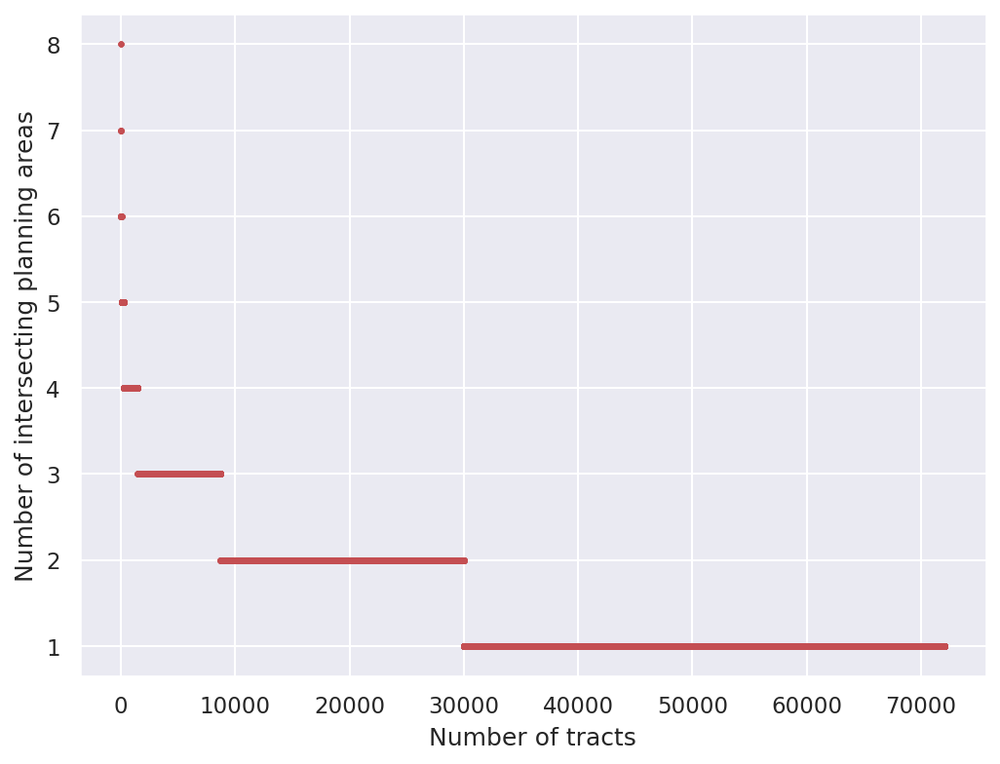

In [49]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot((intersection_matrix != 0)
         .sum(axis=1)
         .sort_values(ascending=False)
         .tolist(), 'ro', ms=2)
plt.xlabel("Number of tracts")
plt.ylabel("Number of intersecting planning areas")
plt.show()

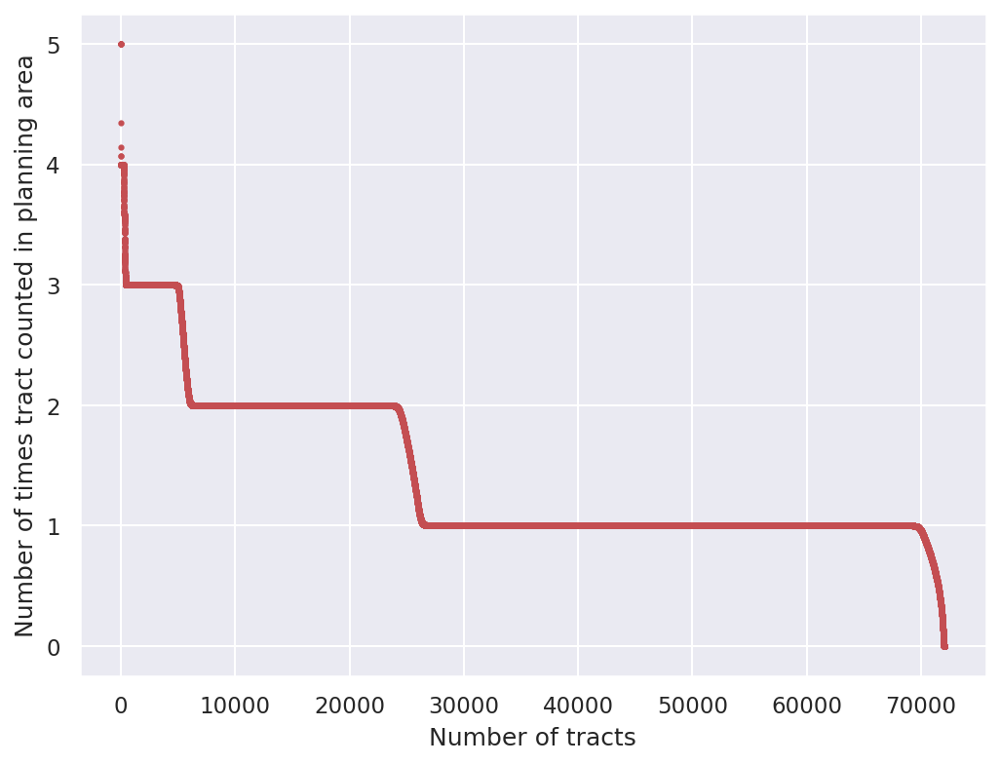

In [50]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(create_intersection_matrix(gdf_intersection, normalization=0)
         .sum(axis=1)
         .sort_values(ascending=False)
         .tolist(), 'ro', ms=2)
plt.xlabel("Number of tracts")
plt.ylabel("Number of times tract counted in planning area")
plt.show()

## Grouping demand data at the county and state level

In [51]:
census_tract_gdf = (
    census_tract_gdf.merge(
        demand_norm_matrix
        .sum(axis=1)
        .reset_index()
        .rename(columns={0: "demand_mwh"})
    )
)

## Created tracts demand aggregated by state
county_gdf = (
    census_tract_gdf[["STCOFIPS", "geometry"]]
    .merge(
        census_tract_gdf
        .groupby("STCOFIPS")[["demand_mwh", "SQMI", "POPULATION"]]
        .sum()
        .reset_index()
    )
)

county_gdf["energy_demand_per_sqmi"] = county_gdf["demand_mwh"] / county_gdf["SQMI"]
county_gdf["demand_per_capita"] = county_gdf["demand_mwh"] / county_gdf["POPULATION"]

## Created tracts demand aggregated by state
state_gdf = (
    census_tract_gdf[["STATE_FIPS", "geometry"]]
    .merge(
        census_tract_gdf
        .groupby("STATE_FIPS")[["demand_mwh", "SQMI", "POPULATION"]]
        .sum()
        .reset_index()
    )
)

state_gdf["energy_demand_per_sqmi"] = state_gdf["demand_mwh"] / state_gdf["SQMI"]

state_gdf["demand_per_capita"] = state_gdf["demand_mwh"] / state_gdf["POPULATION"]

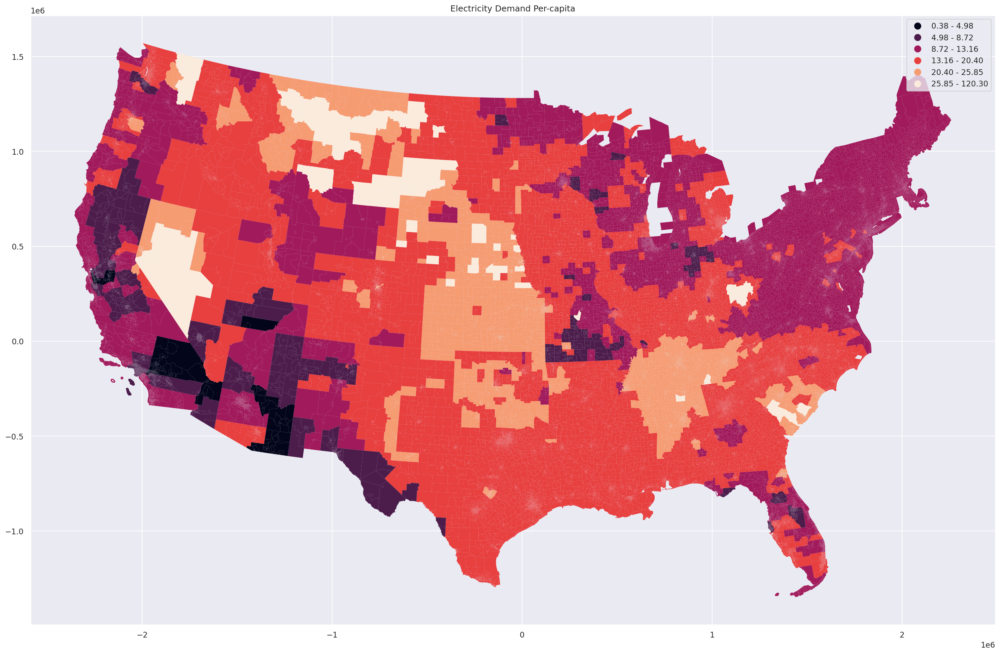

In [52]:
# County level electricity demand per capita
fig, ax = plt.subplots(figsize=(28, 16))
county_gdf.plot(
    column="demand_per_capita",
    ax=ax,
    legend=True,
    scheme="percentiles",
    linewidth=0,
)
plt.title("Electricity Demand Per-capita")
plt.show()

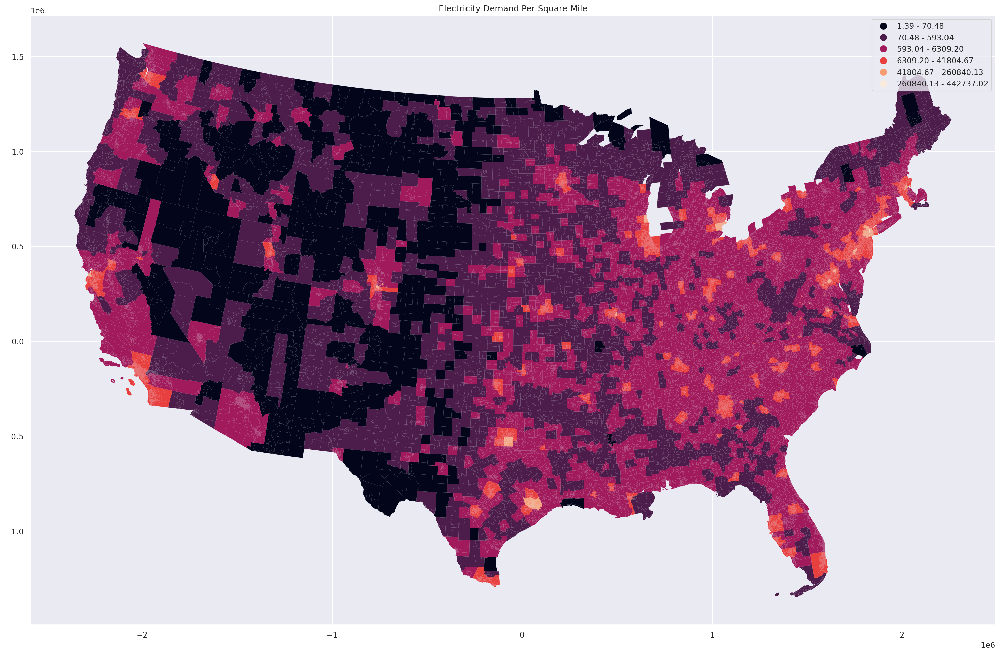

In [53]:
# County demand per unit area
fig, ax = plt.subplots(figsize=(28, 16))
county_gdf.plot(
    column="energy_demand_per_sqmi",
    ax=ax,
    legend=True,
    scheme="percentiles",
    linewidth=0,
)
plt.title("Electricity Demand Per Square Mile")
plt.show()

## Incorporating state annual sales for residential, industrial comparison

In [54]:
sales_df = (state_gdf[["STATE_FIPS", "demand_mwh"]]
            .drop_duplicates()
            .reset_index(drop=True)
            .merge(sales_df, left_on="STATE_FIPS", right_on="FIPS")).drop("FIPS", axis=1)

sales_df = sales_df.sort_values("demand_mwh", ascending=False).reset_index(drop=True)


sales_df["pc_error"] = abs(sales_df["Total"] - sales_df["demand_mwh"]) / sales_df["Total"]


sales_df = sales_df.sort_values("pc_error", ascending=False).reset_index(drop=True)
sales_sum = sales_df["Total"].sum()
allocated_demand_sum = sales_df["demand_mwh"].sum()

sales_df["adjusted_demand"] = sales_df["demand_mwh"] * sales_sum / allocated_demand_sum

sales_df.head()

,STATE_FIPS,demand_mwh,State,Total,Residential,Commercial,Industrial,pc_error,adjusted_demand
0,31,5.411826e+07,NE,30939492,10412008,9553396,10974088,0.749164,4.867483e+07
1,46,2.092579e+07,SD,12856938,5018360,4903243,2935335,0.627587,1.882099e+07
2,20,6.793597e+07,KS,42036979,14187192,16168750,11681037,0.616100,6.110270e+07
3,30,2.293004e+07,MT,14838845,5197686,4921231,4719928,0.545271,2.062365e+07
4,34,1.153089e+08,NJ,76016762,29530689,38807065,7369106,0.516887,1.037106e+08


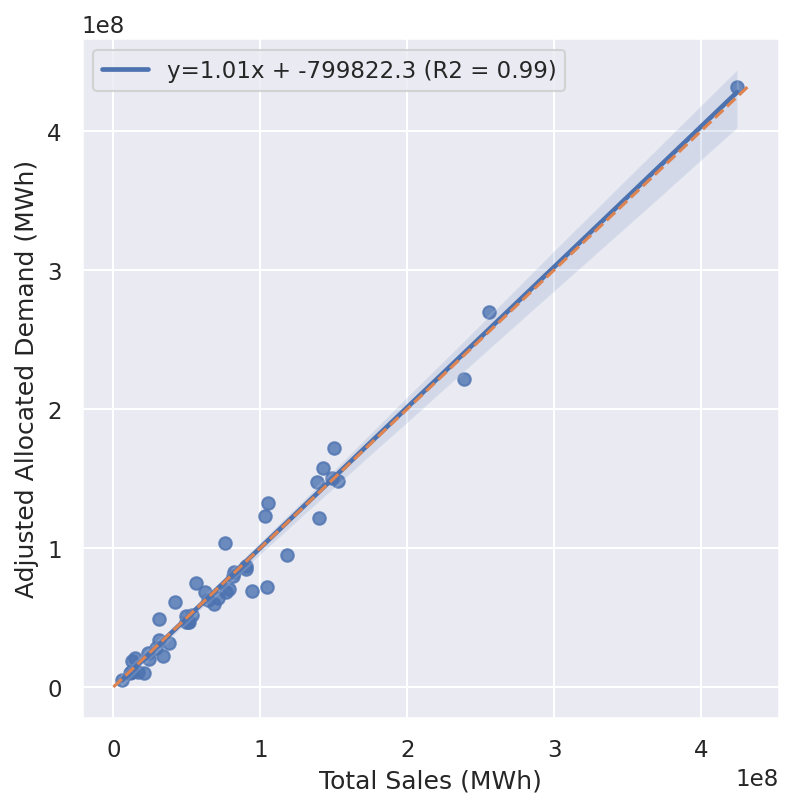

In [55]:
pred = 'adjusted_demand'
actual = "Total"


fig, ax = plt.subplots(figsize=(6, 6))

def r2(x, y):
    
    return scipy.stats.pearsonr(sales_df[actual], sales_df[pred])


slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(sales_df[actual], sales_df[pred])

sns.regplot(x=actual, y=pred, data=sales_df, ax = ax,
            line_kws={'label':"y={0:.2f}x + {1:.1f} (R2 = {2:.2f})".format(slope,intercept,r_value)})


min_lim, max_lim = 0, sales_df[[actual, pred]].max().max()


ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")

plt.xlabel("Total Sales (MWh)")
plt.ylabel("Adjusted Allocated Demand (MWh)")
# ax = sns.jointplot(x="Residential", y="Demand", data=sales_df, stats_func=r2)


ax.legend()
plt.show()

## Allocating demand time series at the state level

In [86]:
dict_state_tracts = (
    census_tract_gdf
    .groupby("STATE_FIPS")
    .agg({"FIPS": list})
    .to_dict()["FIPS"]
)

dict_statefips_names = (
    states_fips_lookup
    .set_index("FIPS")["Name"]
    .to_dict()
)

dict_statefips_names["11"] = "DC"
display(pa_demand_2018.head())
display(pop_norm_matrix.head())

,report_year,utility_id_ferc714,utc_datetime,timezone,demand_mwh,utility_name_ferc714,utility_id_eia
105192,2018,101,2018-01-01 06:00:00,America/Chicago,1565.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105193,2018,101,2018-01-01 07:00:00,America/Chicago,1602.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105194,2018,101,2018-01-01 08:00:00,America/Chicago,1648.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105195,2018,101,2018-01-01 09:00:00,America/Chicago,1702.0,PowerSouth Energy Cooperative (Alabama Electri...,189
105196,2018,101,2018-01-01 10:00:00,America/Chicago,1774.0,PowerSouth Energy Cooperative (Alabama Electri...,189


ID,189,195,229,796,803,924,1307,1738,2507,3046,3408,3413,3989,4922,4958,5326,5416,5701,5723,5748,6022,6452,6455,6567,6909,7004,7140,7349,7801,9191,9216,9234,9617,10623,11208,11249,12293,12397,12658,12667,12686,12710,12745,12825,13337,13407,13434,13501,13511,13994,14015,14077,14354,14610,14624,14725,15143,15248,15466,15473,15500,16183,16534,16572,16609,16687,16868,17166,17539,17543,17690,17833,17858,18429,18445,18454,18642,19281,19545,19610,20169,20858,20910,21554,24211,25471,28503,30151,39347,40211,40218,56669
FIPS,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
01001020100,956.0,956.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020200,1085.0,1085.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020300,1686.5,1686.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020400,2193.0,2193.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
01001020500,5383.0,5383.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Disaggregating demand from planning areas and allocating at the state level

In [88]:
# Utilities that show up in the normalization matrix, but not in the time series:
missing_utils = set(pop_norm_matrix.columns).difference(set(pa_demand_2018.utility_id_eia))

df_state_sales = []
for state_tracts in tqdm(dict_state_tracts.values()):
    df_state_sales.append(
        extract_time_series_demand_multiple_tracts(
            demand_df=pa_demand_2018,
            demand_id_col="utility_id_eia",
            demand_col="demand_mwh",
            time_col="utc_datetime",
            normed_weights=pop_norm_matrix.drop(missing_utils, axis=1),
            target_ids=state_tracts,
        )
    )
    
df_state_sales = pd.concat(
    df_state_sales,
    axis=1,
    keys=[dict_statefips_names[key] + "_Sales" for key in dict_state_tracts.keys()]
)

100%|██████████| 48/48 [00:07<00:00,  6.17it/s]


## Aggregating time series at the monthly level for comparison/visualization along with state sales data

In [89]:
df_state_sales_monthly = df_state_sales.groupby(pd.Grouper(freq="M")).sum()

df_state_sales_2018 = (df_state_sales_monthly[(df_state_sales_monthly.index >= "2018-01-01") &
                                              (df_state_sales_monthly.index <= "2018-12-31")]
                       .stack()
                       .reset_index()
                       .rename(columns={"level_1": "State", 0: "GWh_allocated"}))

df_state_sales_2018["GWh_allocated"] = df_state_sales_2018["GWh_allocated"] / 1000

df_state_sales_2018["utc_datetime"] = (df_state_sales_2018["utc_datetime"].dt.year * 100 +
                                     df_state_sales_2018["utc_datetime"].dt.month)

df_state_sales_2018["State"] = df_state_sales_2018["State"].str.rstrip('Sales').str.rstrip('_').str.strip()

In [90]:
## Merging state monthly sales with allocated demand data for comparison
df_check = df_state_sales_2018.merge(df_sales_eia_2018, how="inner")
## Scaling Demand Time Series by a constant factor to make the total sums equal
df_check["GWh_adjusted"] = df_check["GWh_allocated"] * df_check["GWh"].sum() / df_check["GWh_allocated"].sum()
df_check["GWh_allocated"].sum() / df_check["GWh"].sum()

1.1111427099423292

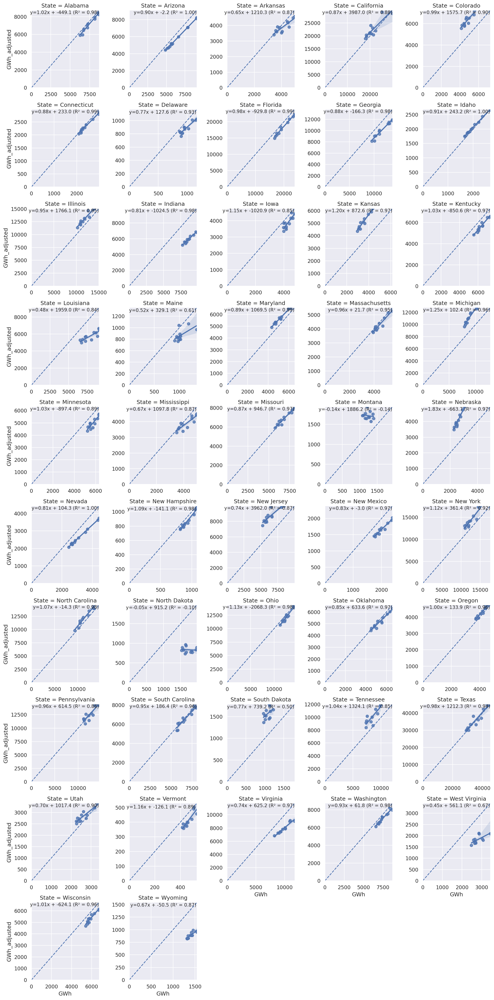

In [91]:
pred = 'GWh_adjusted'
actual = "GWh"


g = sns.FacetGrid(df_check, col="State", col_wrap=5, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

state_list = df_check["State"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["State"]==state_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

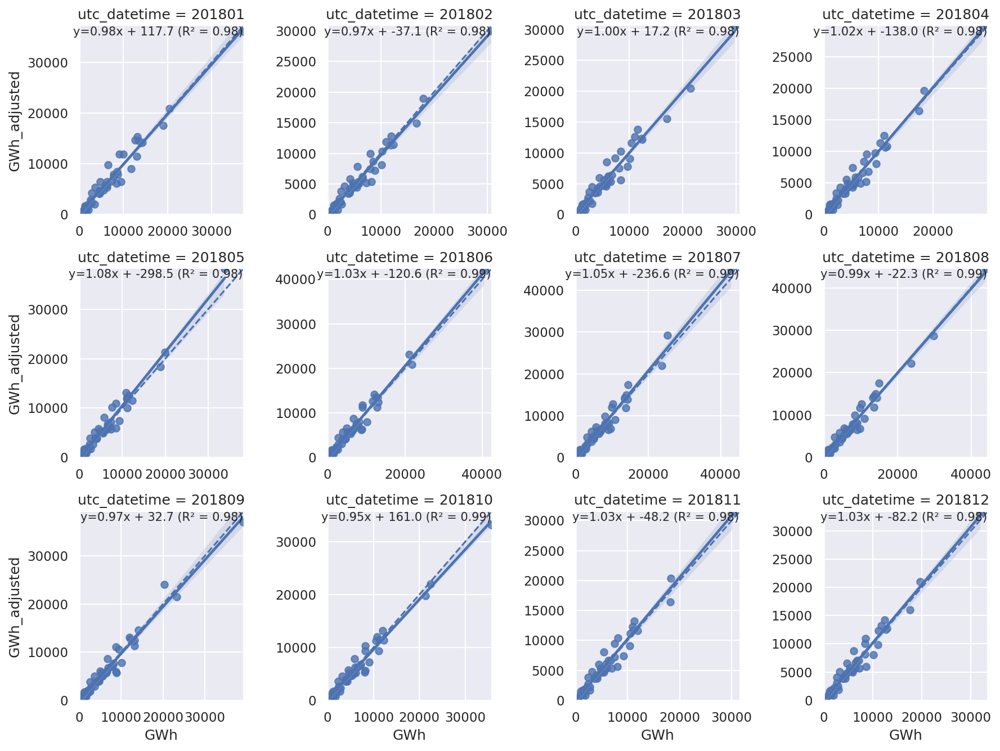

In [92]:
pred = 'GWh_adjusted'
actual = "GWh"

g = sns.FacetGrid(df_check, col="utc_datetime", col_wrap=4, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

time_list = df_check["utc_datetime"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["utc_datetime"]==time_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
      
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

## Adjusting state bias in the monthly demand allocation

In [93]:
state_demand_factors = df_check.groupby("State").mean()
state_demand_factors["factor"] = state_demand_factors["GWh"] / state_demand_factors["GWh_adjusted"]
state_demand_factors = state_demand_factors["factor"].to_dict()
state_demand_factors

df_check["state_GWh_adjusted"] = df_check.apply(lambda x: x["GWh_adjusted"] * state_demand_factors[x["State"]],
                                                axis=1)
df_check

,utc_datetime,State,GWh_allocated,GWh,GWh_adjusted,state_GWh_adjusted
0,201801,Alabama,9358.436568,8571.05263,8422.353389,8770.926446
1,201801,Arizona,5405.350401,5461.68315,4864.677014,5395.159086
2,201801,Arkansas,4659.524230,4485.75249,4193.452550,4425.753030
3,201801,California,23189.575944,20455.04950,20870.024828,19741.590739
4,201801,Colorado,7156.215141,4646.72861,6440.410469,4862.808627
...,...,...,...,...,...,...
559,201812,Virginia,8955.330307,10083.55830,8059.568070,10015.908145
560,201812,Washington,9061.118836,8426.91923,8154.775039,8676.638450
561,201812,West Virginia,2066.844536,3024.45784,1860.107183,2852.829670
562,201812,Wisconsin,5901.182530,5910.84746,5310.913240,5866.261728


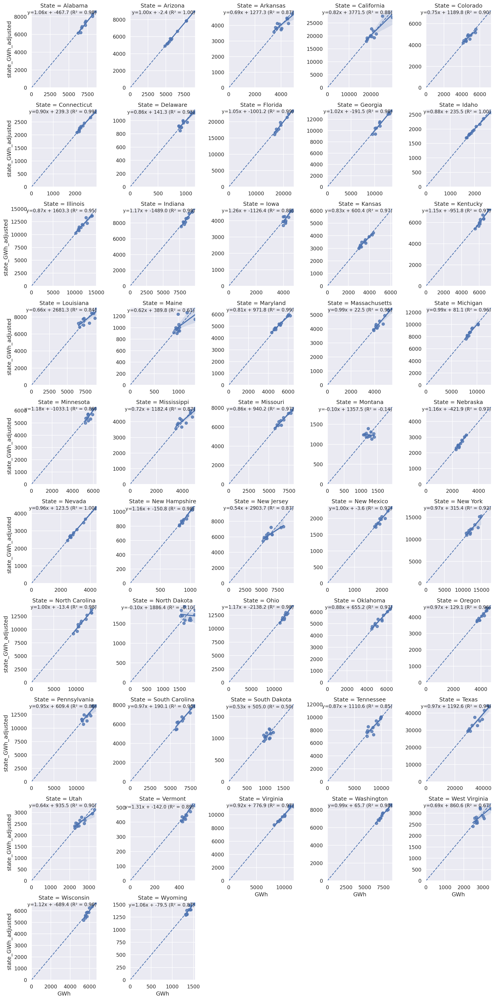

In [94]:
pred = 'state_GWh_adjusted'
actual = "GWh"


g = sns.FacetGrid(df_check, col="State", col_wrap=5, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

state_list = df_check["State"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["State"]==state_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

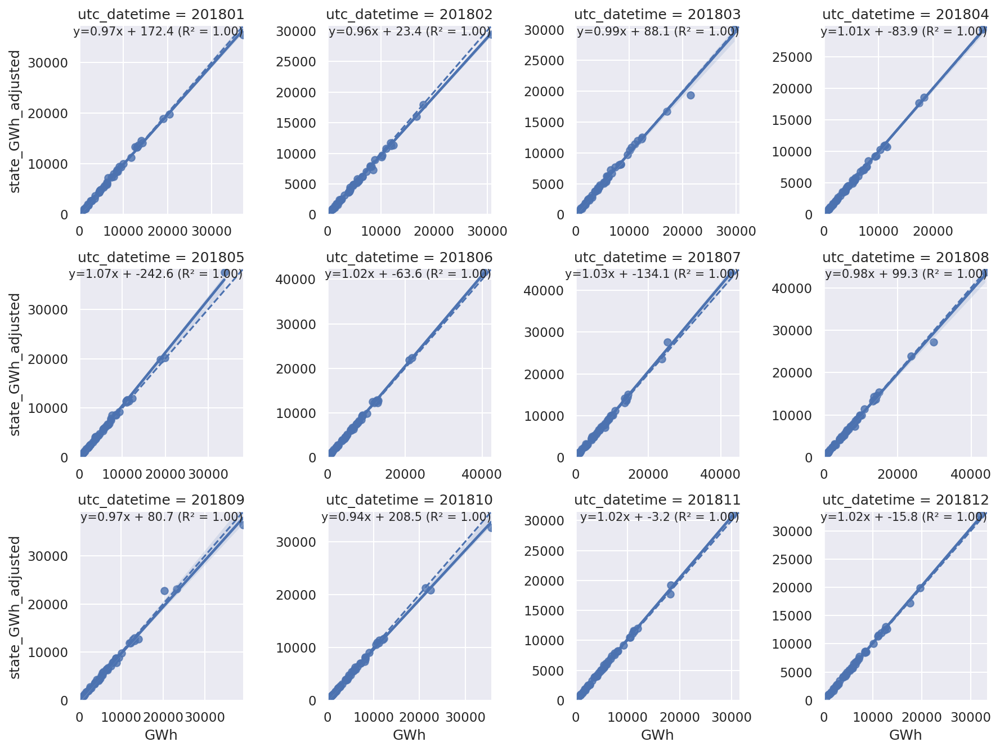

In [95]:
pred = 'state_GWh_adjusted'
actual = "GWh"

g = sns.FacetGrid(df_check, col="utc_datetime", col_wrap=4, sharey=False, sharex=False)
g.map(sns.regplot, actual, pred)

time_list = df_check["utc_datetime"].unique().tolist()

counter = 0

for ax in g.axes.flat:
    
    df_temp = df_check[df_check["utc_datetime"]==time_list[counter]]
    min_max = df_temp.describe().loc[["min", "max"], ["GWh", "GWh_adjusted"]]
    
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(df_temp[actual], df_temp[pred])
      
    
#     min_lim, max_lim = min_max.min().min(), min_max.max().max()
    min_lim, max_lim = 0, min_max.max().max()
    
    
    ax.plot((min_lim, max_lim), (min_lim, max_lim), ls="--")
    ax.text(max_lim-10, max_lim-10,"y={0:.2f}x + {1:.1f} (R² = {2:.2f})".format(slope,intercept,r_value),
            horizontalalignment='right', verticalalignment="top")
    
    ax.set_ylim(min_lim, max_lim)
    ax.set_xlim(min_lim, max_lim)
    
    
    counter += 1

## Finding intersection area of each census tract with each ReEDS intersection area for demand allocation 

In [96]:
%%time

# The pickled intersection geometries should be here in this directory:
pickled_reeds_path = pathlib.Path.cwd() / "tracts_reeds_areas_ratios_stacked.pkl"

# If we don't have the saved intersection geometry we need to regenerate it:
if not pickled_reeds_path.is_file():
    logger.info("No precomputed Census tract / ReEDS BA intersections found. Creating them.")
    reeds_intersection_gdf = create_stacked_intersection_df(census_tract_gdf, reeds_gdf, gdf_source_col="OBJECTID")
    pickle.dump(reeds_intersection_gdf, pickled_reeds_path.open(mode="wb"))

# At this point we should definitely have the intersection file available:
with pickled_reeds_path.open(mode="rb") as f:
    logger.info("Reading pre-computed Census tract / ReEDS BA intersections.")
    reeds_intersection_gdf = pickle.load(f)

2020-05-28 22:06:24,996 [    INFO] root:12 Reading pre-computed Census tract / ReEDS BA intersections.
CPU times: user 8.18 ms, sys: 3.9 ms, total: 12.1 ms
Wall time: 19.1 ms


## Pivoting the mapping to a matrix, and scaling/normalization by individual population, then finding allocated demand accordingly

In [97]:
reeds_intersection_matrix = create_intersection_matrix(reeds_intersection_gdf,
                                                       gdf_source_col="OBJECTID",
                                                       gdf_intersection_col='gdf_source_intersection_fraction')

pop_norm_reeds = matrix_linear_scaling(reeds_intersection_matrix, census_tract_gdf)

reeds_demand_2018 = matrix_linear_scaling(pop_norm_reeds,
                                          gdf_scale=census_tract_gdf,
                                          gdf_scale_col="demand_mwh",
                                          axis_scale=1)

reeds_gdf = (
    reeds_gdf.set_index("OBJECTID")
    .assign(demand_mwh=reeds_demand_2018.sum(axis=0))
    .reset_index()
)

# Aggregate REEDS data at PCA level
reeds_pca = (
    reeds_gdf
    .drop("demand_mwh", axis=1)
    .merge(
        reeds_gdf
        .groupby("pca_num")["demand_mwh"]
        .sum().reset_index()
    )
)

## Mapping from Census-Planning Areas & Census-REEDS to REEDS-Planning Areas

In [98]:
drop_fips = (set(pop_norm_reeds[pop_norm_reeds.sum(axis=1) == 0].index)
             .union(set(pop_norm_matrix[pop_norm_matrix.sum(axis=1) == 0].index)))

common_fips = (set(pop_norm_matrix.index)
               .intersection(set(pop_norm_reeds.index))
               .difference(drop_fips))

pop_ferc_reeds= (pop_norm_reeds
                 .loc[common_fips].T
                 .divide(pop_norm_reeds.loc[common_fips]
                         .sum(axis=1))) @ pop_norm_matrix.loc[common_fips]

## Mapping FERC714 demand time series to pca areas

In [99]:
# Utilities that show up in normalization matrix but not in the time series
missing_utils = set(pop_ferc_reeds.columns).difference(set(pa_demand_2018.utility_id_eia))

dict_reeds_tracts = reeds_gdf.groupby("pca").agg({"OBJECTID": list}).to_dict()["OBJECTID"]

df_reeds_sales = []
for objectids in tqdm(dict_reeds_tracts.values()):
    df_reeds_sales.append(
        extract_time_series_demand_multiple_tracts(
            demand_df=pa_demand_2018,
            demand_id_col="utility_id_eia",
            demand_col="demand_mwh",
            time_col="utc_datetime",
            normed_weights=pop_ferc_reeds.drop(missing_utils, axis=1),
            target_ids=objectids,
        )
    )
    
df_reeds_sales = pd.concat(df_reeds_sales, axis=1, keys=dict_reeds_tracts.keys())
df_reeds_sales_monthly = df_reeds_sales.groupby(pd.Grouper(freq="M")).sum() 

100%|██████████| 134/134 [00:12<00:00, 10.80it/s]


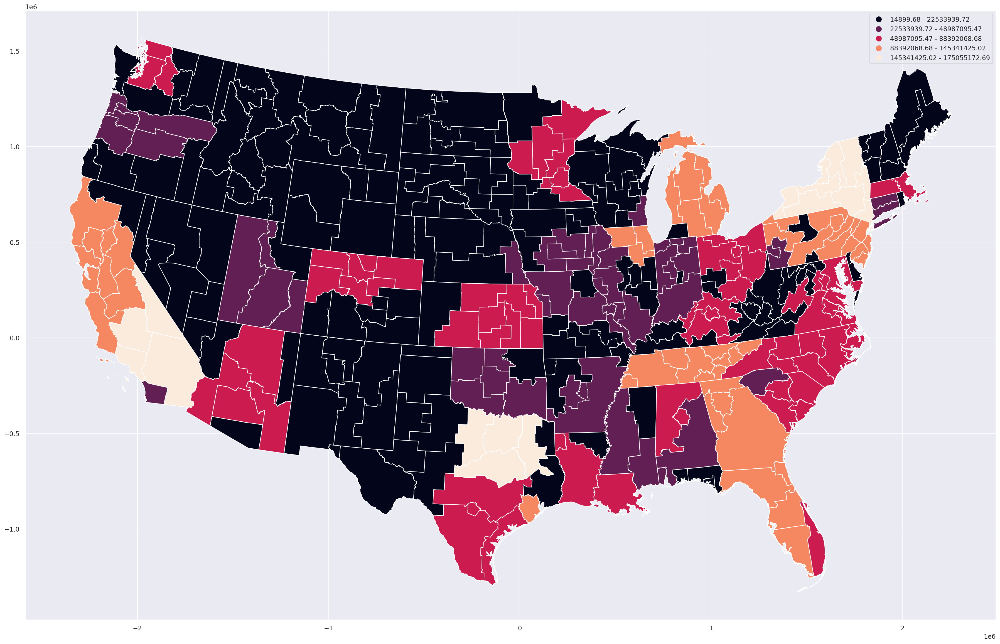

In [100]:
fig, ax = plt.subplots(figsize=(30, 20))
reeds_pca.plot(
    "demand_mwh",
    ax=ax,
    legend=True,
    scheme="NaturalBreaks"
)
plt.show()

# Analysis of Texas: a tale of two planning areas - SPP and ERCOT)

In [101]:
ERCOT_SPP_data = pa_demand_2018[
    (pa_demand_2018["utility_id_eia"].isin([17690, 5723])) &
    (pa_demand_2018["utc_datetime"] >= "2018-01-01") &
    (pa_demand_2018["utc_datetime"] < "2019-01-01")]

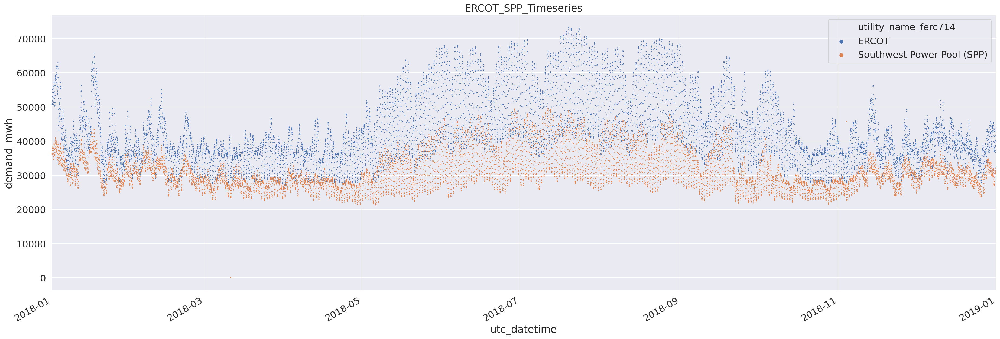

In [102]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))

ax = sns.scatterplot(x="utc_datetime", y="demand_mwh", data=ERCOT_SPP_data, s=1, edgecolor=None,
                     hue="utility_name_ferc714")
plt.title("ERCOT_SPP_Timeseries")


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])

mpl.rcParams.update(mpl.rcParamsDefault)
plt.show()

## Texas Counties: Harris County (ERCOT) vs Potter County (SPP)

Demand was disaggregated into census tracts, allocated on the basis of population and intersecting planning areas. Then, it can be further reaggregated at different levels, like counties, states, ReEDS areas etc.

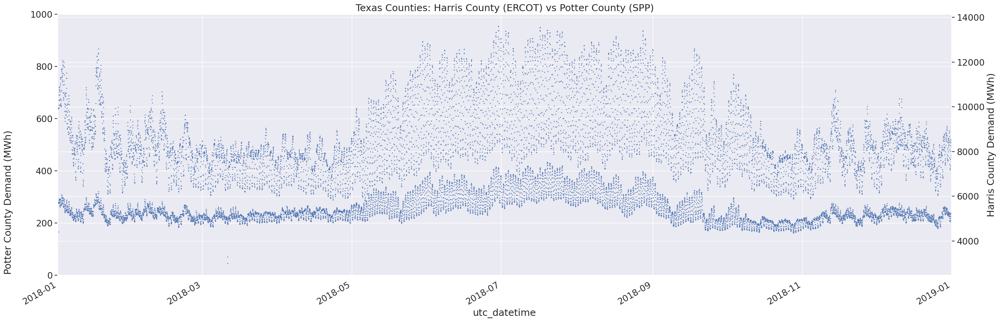

In [103]:
# extract_time_series_demand_multiple_tracts(ferc_df, pop_norm_matrix, )
# Utilities that show up in normalization matrix but not in the time series
missing_utils = set(pop_norm_matrix.columns).difference(set(pa_demand_2018.utility_id_eia))

harris_county_fips = census_tract_gdf[census_tract_gdf["FIPS"].str[:5]=="48201"]["FIPS"].tolist()
harris_county_demand = extract_time_series_demand_multiple_tracts(
    demand_df=pa_demand_2018,
    demand_id_col="utility_id_eia",
    demand_col="demand_mwh",
    time_col="utc_datetime",
    normed_weights=pop_norm_matrix.drop(missing_utils, axis="columns"),
    target_ids=harris_county_fips,
)
harris_county_demand = harris_county_demand.reset_index().rename(columns={0:"demand_mwh"})

potter_county_fips = census_tract_gdf[census_tract_gdf["FIPS"].str[:5]=="48375"]["FIPS"].tolist()
potter_county_demand = extract_time_series_demand_multiple_tracts(
    demand_df=pa_demand_2018,
    demand_id_col="utility_id_eia",
    demand_col="demand_mwh",
    time_col="utc_datetime",
    normed_weights=pop_norm_matrix.drop(missing_utils, axis="columns"),
    target_ids=potter_county_fips,
)
potter_county_demand = potter_county_demand.reset_index().rename(columns={0:"demand_mwh"})

sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))

sns.scatterplot(
    x="utc_datetime",
    y="demand_mwh",
    data=potter_county_demand,
    s=1,
    edgecolor=None,
    ax=ax,
    legend=False
)

ax2 = ax.twinx()

sns.scatterplot(
    x="utc_datetime",
    y="demand_mwh",
    data=harris_county_demand,
    s=1,
    edgecolor=None,
    ax=ax2,
    legend=False
)

plt.title("Texas Counties: Harris County (ERCOT) vs Potter County (SPP)")

fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])

ax.set_ylim([0, 1000])

ax.set_ylabel("Potter County Demand (MWh)")
ax.yaxis.set_label_coords(-0.05,0.28)
ax2.set_ylabel('Harris County Demand (MWh)')

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

## Time Series of individual PCAs in Texas

In [104]:
pca_texas = ["p" + str(num) for num in [48, 57] + list(range(60, 68, 1))]
pca_id_dict = reeds_gdf.groupby("pca").agg({"OBJECTID": list}).to_dict()["OBJECTID"]
pca_id_texas = {k:v for k, v in pca_id_dict.items() if k in pca_texas}
pca_id_texas

df_reeds_tx = df_reeds_sales[pca_id_texas.keys()][(df_reeds_sales.index >= "2018-01-01") &
                                    (df_reeds_sales.index < "2019-01-01")]

df_reeds_tx_unstack = df_reeds_tx.unstack().reset_index().rename(columns={"level_0": "PCA", 0: "demand_mwh"})

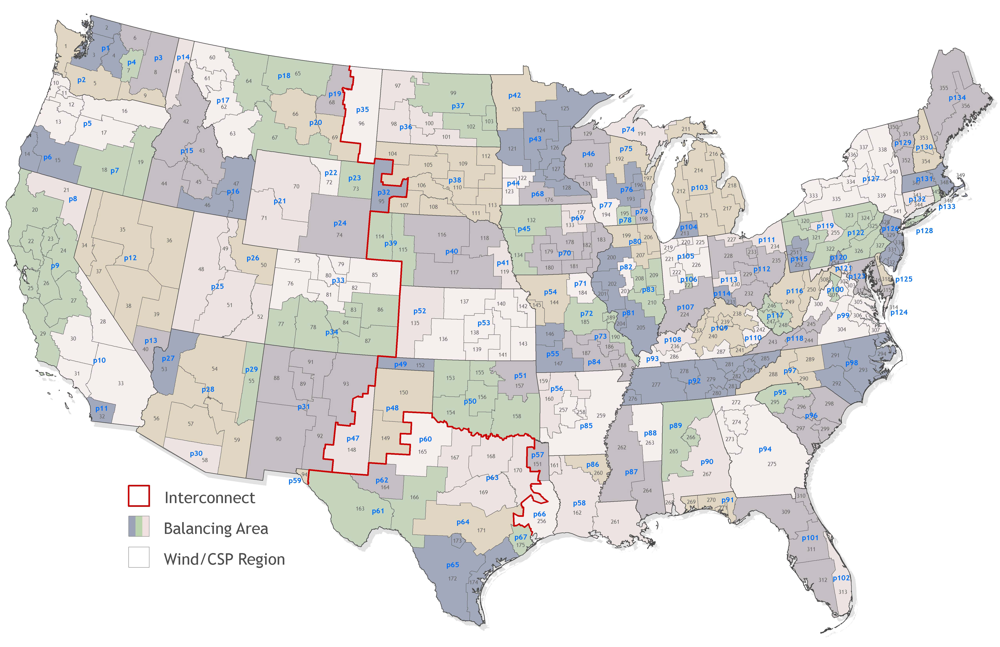

In [105]:
from IPython.display import Image
Image(filename=reeds_path / "reeds_ba_us_11x17.jpg") 

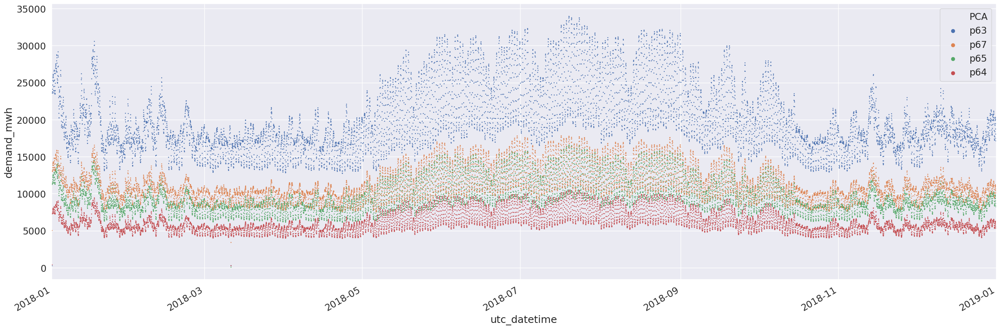

In [106]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[:4]
ax = sns.scatterplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     s=1, edgecolor=None, hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

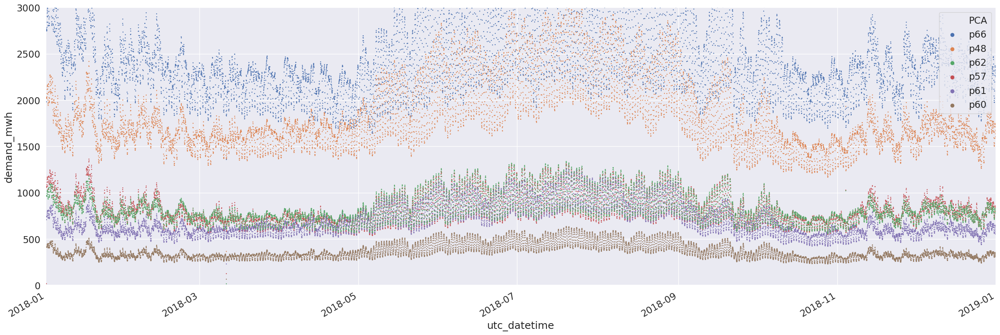

In [107]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[-6:]
ax = sns.scatterplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     s=1, edgecolor=None, hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 1, 1), datetime.date(2019, 1, 1)])
ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

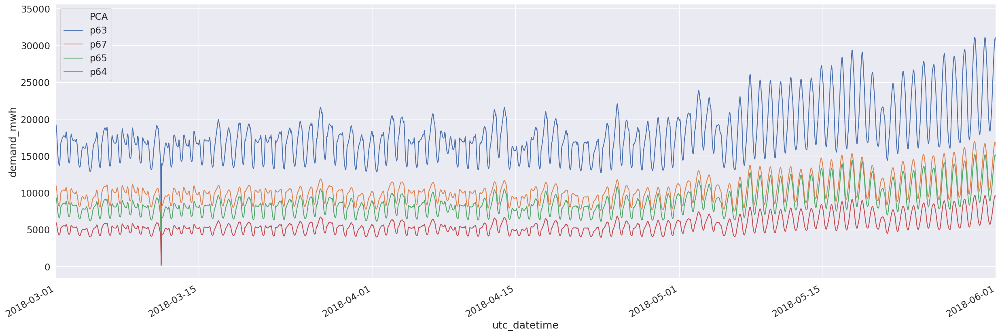

In [108]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[:4]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 3, 1), datetime.date(2018, 6, 1)])
# ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

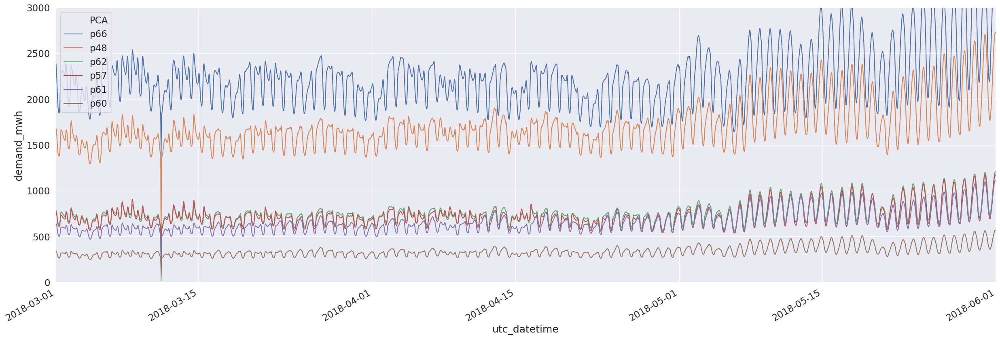

In [109]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))

pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[-6:]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 3, 1), datetime.date(2018, 6, 1)])
ax.set_ylim([0, 3000])
plt.legend(loc="upper left")
plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

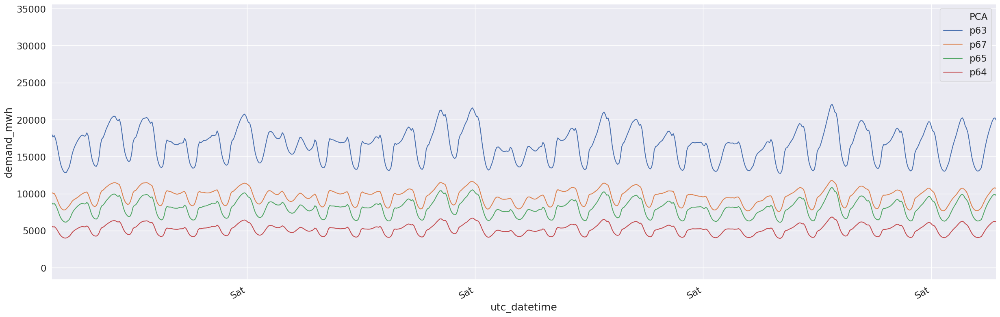

In [110]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[:4]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 4, 1), datetime.date(2018, 4, 30)])

# Define the date format
date_form = mpl.dates.DateFormatter("%a")
ax.xaxis.set_major_formatter(date_form)

ax.xaxis.set_major_locator(mpl.dates.DayLocator(interval=7))
# ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

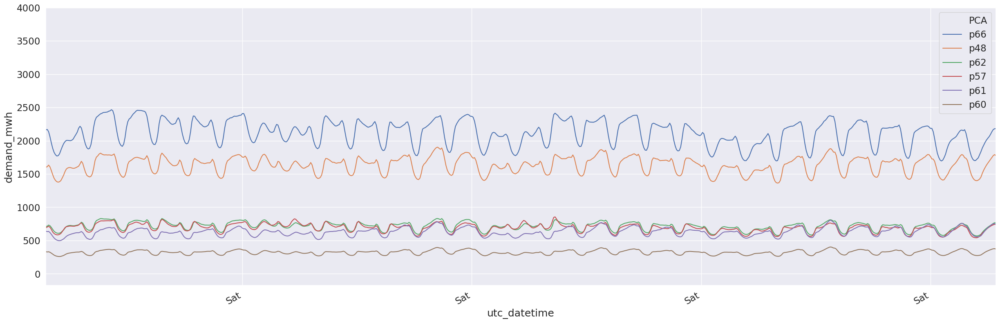

In [111]:
sns.set(font_scale=1.5)
fig, ax = plt.subplots(figsize=(30, 10))


pcas = df_reeds_tx.sum().sort_values(ascending=False).index.tolist()[-6:]
ax = sns.lineplot(x="utc_datetime", y="demand_mwh",
                     data=df_reeds_tx_unstack[df_reeds_tx_unstack["PCA"].isin(pcas)],
                     hue="PCA", hue_order=pcas)


fig.autofmt_xdate()
ax.set_xlim([datetime.date(2018, 4, 1), datetime.date(2018, 4, 30)])

# Define the date format
date_form = mpl.dates.DateFormatter("%a")
ax.xaxis.set_major_formatter(date_form)

ax.xaxis.set_major_locator(mpl.dates.DayLocator(interval=7))
# ax.set_ylim([0, 3000])

plt.show()
mpl.rcParams.update(mpl.rcParamsDefault)

In [3]:
import pandas as pd
fff1 = frozenset([1, 2])
fff2 = frozenset([3, 4])
qqq = pd.DataFrame([[fff1, 7],
                    [fff2, 6]], columns=["a", "b"])
display(qqq)

,a,b
0,"(1, 2)",7
1,"(3, 4)",6


In [13]:
search = lambda

qqq[qqq["a"].apply(lambda x: 1 in x)]

,a,b
0,"(1, 2)",7
